In [1]:
from load_data import parameters_dict, simulation_file_paths

import numpy as np
# import saved feature array
feature_arr = np.load("feature_arr.npy")

In [2]:
# check gpu
import tensorflow as tf
print("Num GPUs Available: ", len(
    tf.config.experimental.list_physical_devices('GPU')))

2024-04-10 11:28:14.351655: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-10 11:28:15.616148: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Num GPUs Available:  1


2024-04-10 11:28:16.646457: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-10 11:28:16.936238: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-10 11:28:16.936497: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [3]:
import tensorflow as tf
print("Num GPUs Available: ", len(
    tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [4]:
from sklearn.cluster import KMeans

# kmeans clustering
kmeans = KMeans(n_clusters=20, random_state=42)
kmeans.fit(feature_arr)



KMeans(n_clusters=20, random_state=42)

In [5]:
kmeans.fit(feature_arr)
print(len(set(kmeans.labels_)) - (1 if -1 in kmeans.labels_ else 0))

import plotly.graph_objs as go
import plotly.express as ptx

class_dict = {f"Class {i}": list() for i in range(len(set(kmeans.labels_)))}
class_dict["Outliers"] = list()
for index, path in enumerate(simulation_file_paths):
    class_ = kmeans.labels_[index]
    if class_ == -1:
        class_dict["Outliers"].append(str(path))
    else:
        class_dict[f"Class {class_}"].append(str(path))

traces = list()
for class_id, colour in zip(class_dict, ptx.colors.qualitative.Dark24):
    traces.append(
        go.Scatter(
            x=[
                parameters_dict[f]["H"]
                for f in class_dict[class_id]
            ],
            y=[
                parameters_dict[f]["E"]
                for f in class_dict[class_id]
            ],
            mode="markers",
            name=class_id,
            opacity=0.7,
            marker=dict(
                size=11,
                color=colour,
            ),
        )
    )

fig = go.Figure(data=traces)
fig.update_layout(
    autosize=False,
    width=990,
    height=600,
    margin=dict(
        l=10,
        r=10,
        b=25,
        t=25,
    ),
    xaxis_title=r"$\mu_0 \mathbf{H} \text{ (T)}$",
    yaxis_title=r"$\Delta \text{E (J)}$",
)

20


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#2E91E5', 'size': 11},
              'mode': 'markers',
              'name': 'Class 0',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [0.6698909203044445, 0.6698909203044445, 0.6698909203044445,
                    ..., 0.6546227281234838, 0.6546227281234838,
                    0.6546227281234838],
              'y': [0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0]},
             {'marker': {'color': '#E15F99', 'size': 11},
              'mode': 'markers',
              'name': 'Class 1',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [1.0250054051919253, 1.0520917899467686, 0.9646048372886914,
                    0.9207083700108073, 1.1929253724128137, 1.0976181620612193,
                    1.1469998419153746, 0.9808002518152286, 0.9291651296158059,
                    0.9249011197760583, 0.836415867916509, 1.0263514491692831,
                    1.1141259767768092, 1.1071872073552032, 1.1086917079049514,
                    0.833905885471391, 1.1955561140906563, 0.8202076505365383,
                    0.9864011704620863, 1.0269934826491744, 1.1305127224462546,
                    1.072535115051649, 0.8197104804685906, 1.0847157664043714,
                    0.7867600810417402, 1.0202856143980115, 0.8028197934355251,
                    1.1954039370060294, 0.9152481654382668, 0.8347188180131706,
                    1.0138643716232256, 1.051788883420381, 0.907883323204455,
                    0.8362432922424539, 0.9545452567039938, 0.9066727290485987,
                    0.8775627476181801, 1.1735348343250152, 0.8115632219784964,
                    1.0019658059640772, 0.9186397277280677, 0.9934355497864474,
                    0.9343751092958316, 1.086844012242128, 1.1827621140750701,
                    0.8467781858029751, 0.9130732008672463, 0.9748296910160761,
                    1.1661932580993006, 0.9817613249810861, 1.0238498196198644,
                    0.9123660783014961, 1.1090159870748109, 0.8323809952950884,
                    0.790605703246432, 0.9269515687798381, 0.9698279207025753,
                    0.9713599753359391, 0.906661915903076, 1.005939071376994,
                    1.0800518498321572, 1.1770707825786892, 1.116615272717344,
                    1.0718182521919446, 0.8843678484873443, 0.9641370033042524,
                    1.0505179873860966, 0.8027673907963068, 1.1402152872098037,
                    0.8649326048187083, 1.0235853459745574, 0.8237846523064629,
                    0.9581704014515433, 1.0706344716555656, 0.7897525671244984,
                    1.0045093174691133, 0.9935376695424457, 0.8329917741232538,
                    0.8850705377887228, 0.9742161584909454, 1.0369806453997337,
                    0.7983981074624066, 1.173866898580667, 0.8204690678947646,
                    1.0934684341269973, 1.0515676079188805, 0.9898962581019028,
                    1.112307266850654, 1.140888569640036, 1.0282460428447024,
                    0.9981815390658192, 0.8637599795213791, 1.0236103138012014,
                    1.0752641036873176, 0.9448716255746837, 1.0970603286365799,
                    0.9953320671441747, 0.8267534068632554, 0.9951803409357836,
                    0.9175643761190703, 1.035969243607655, 1.1603903092753214,
                    1.0526020064240975, 1.0539468285340443, 0.9861663886355949,
                    1.0521215565114765, 1.1120120774019429, 1.1122117803842337,
                    1.0465188935411227, 0.8390011505117905, 1.0518182900141038,
                    1.016188363672831, 1.0092104846623406, 0.9952270358071662,
                    0.9586195626295599, 1.0356299817446473, 1.1947724585988408,
                    1.0274713182492725, 0.8323528064593518, 0.8160392176894741,
                    0.9813592490631781, 0.809569514778482, 1.0469586493867697,
                    0.9440337622094458, 1.0485608360241712, 0.9965448251651002,
                    0.91792475

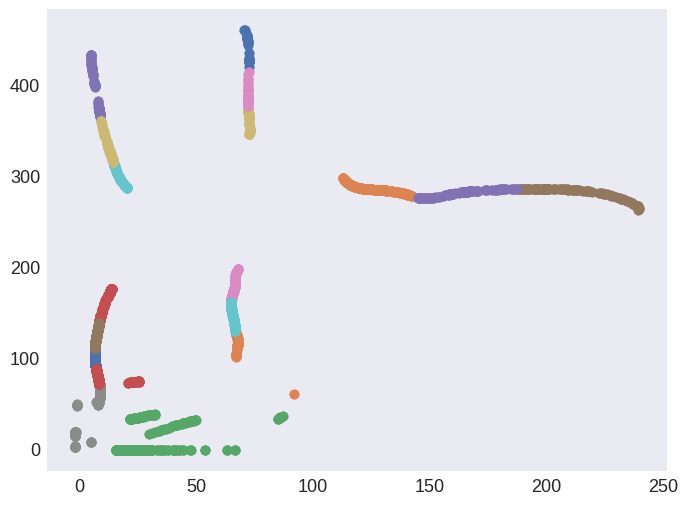

In [7]:
# plot the feature space in 3d color coded by the cluster
import matplotlib.pyplot as plt
for i in range(len(set(kmeans.labels_))):
    plt.scatter(feature_arr[kmeans.labels_ == i, 0], feature_arr[kmeans.labels_ == i, 1], label=f"Cluster {i}")
plt.show()

/home/tux/optim/plotting.py:199: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



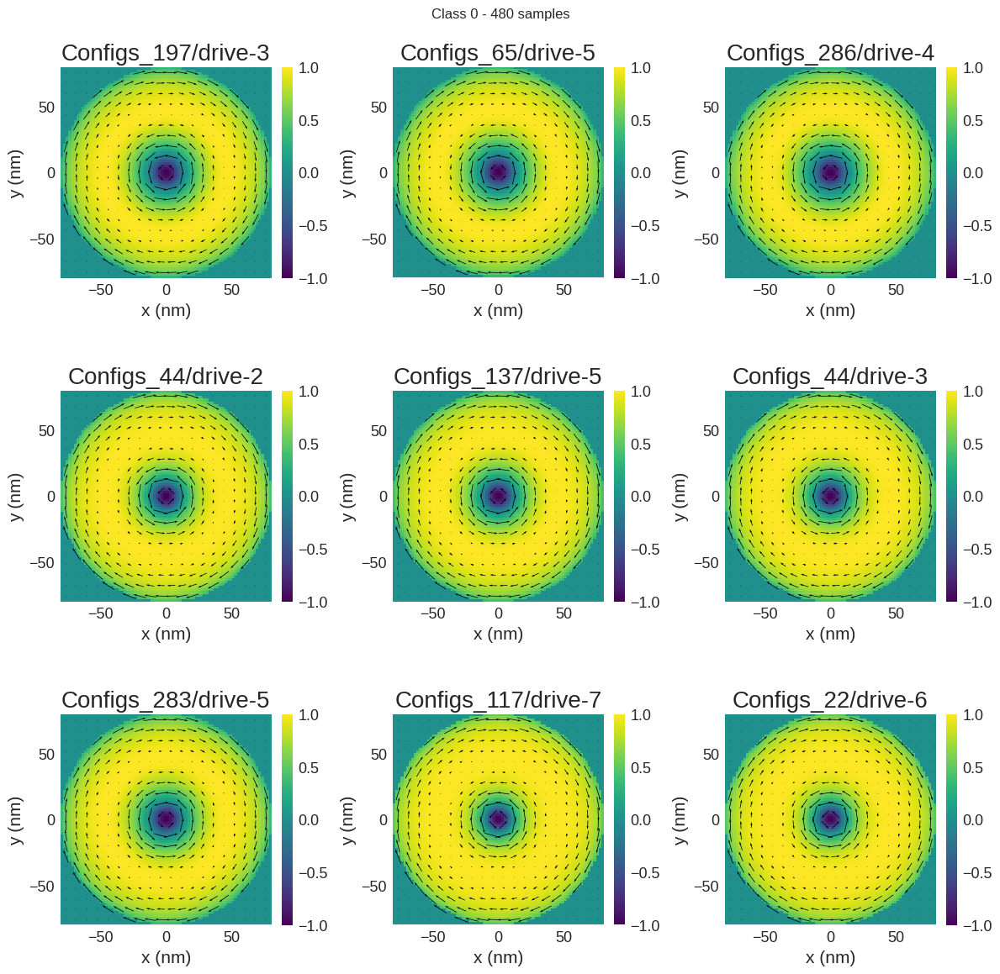

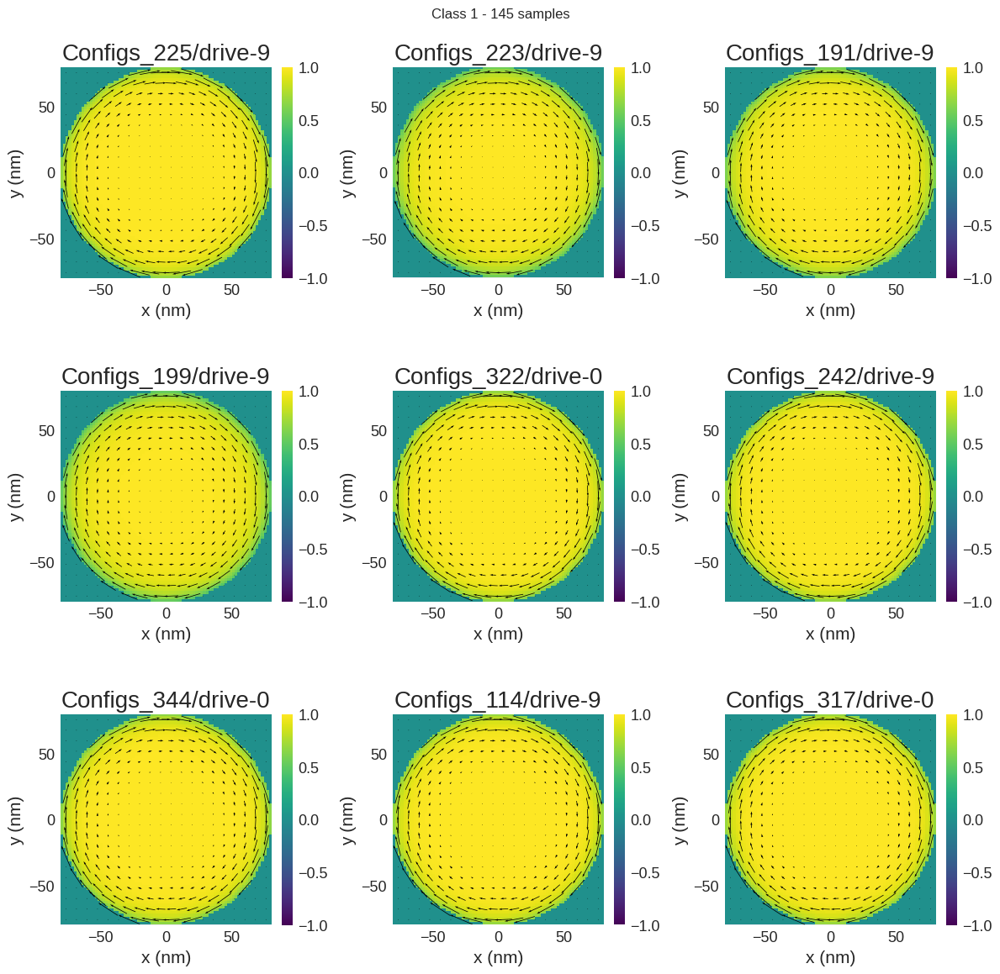

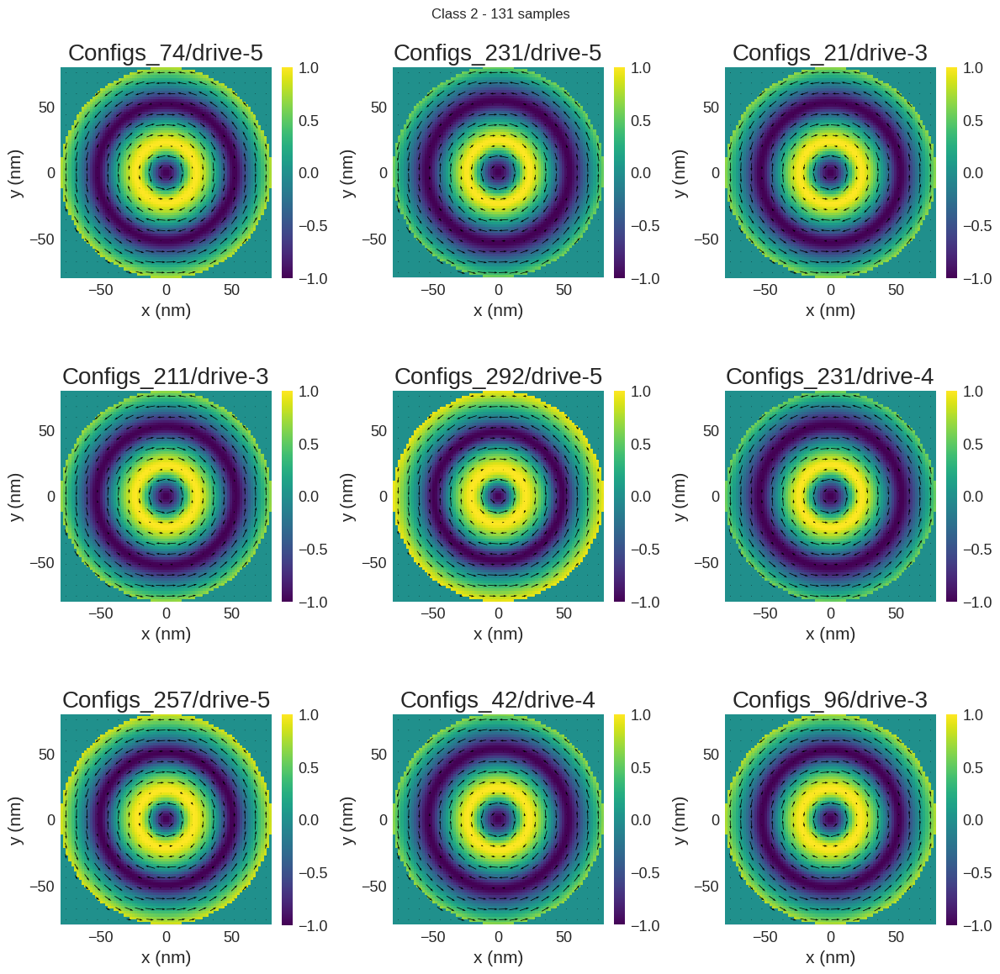

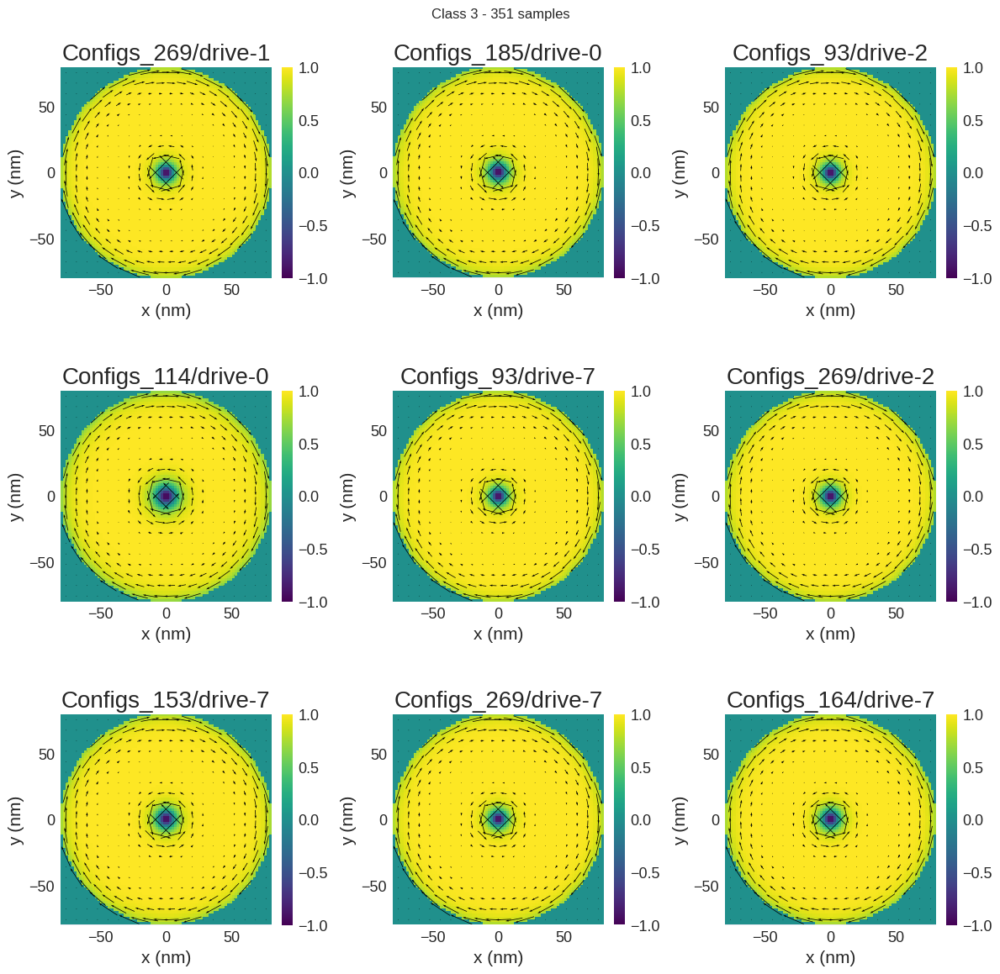

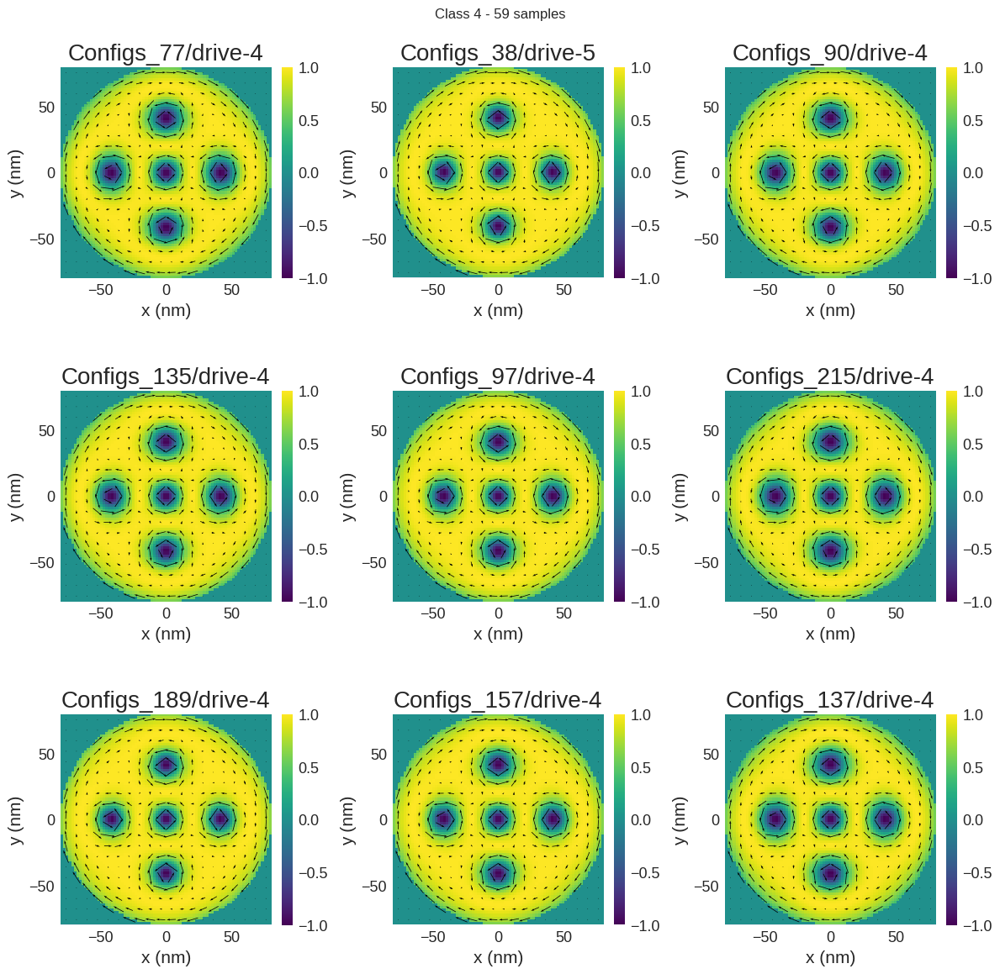

...

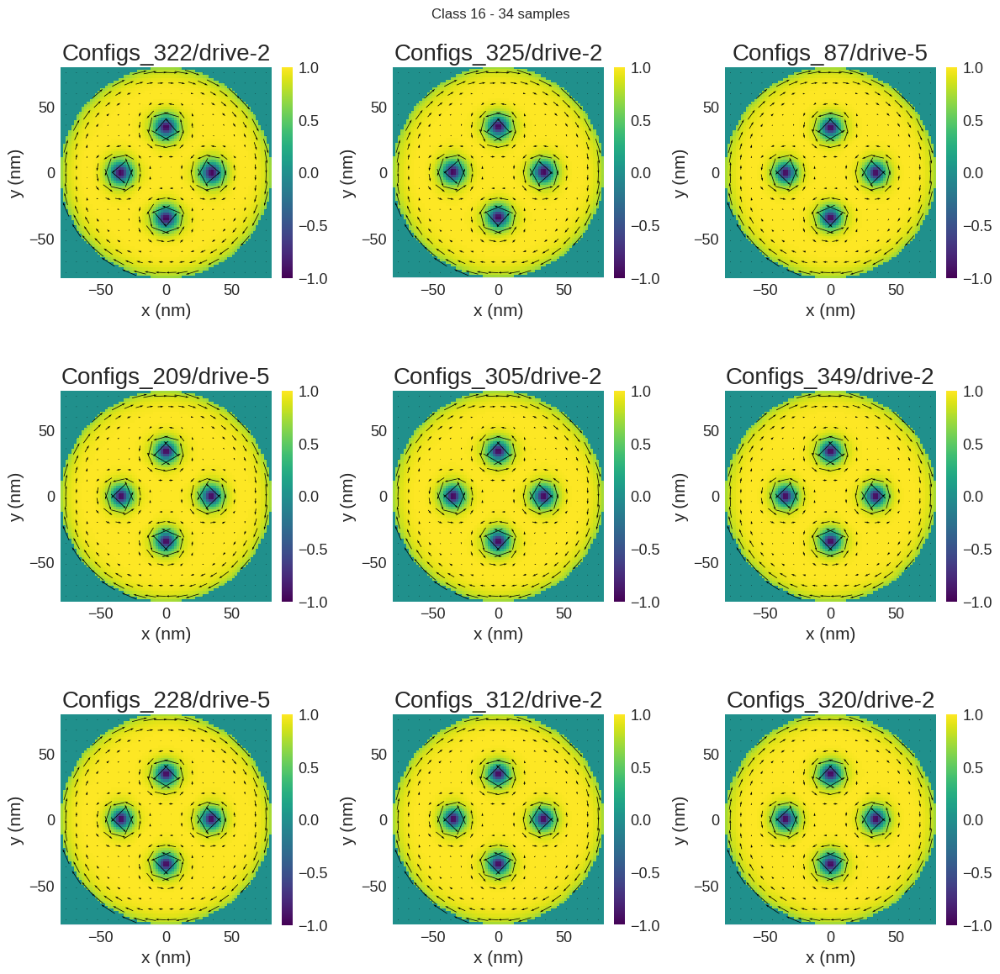

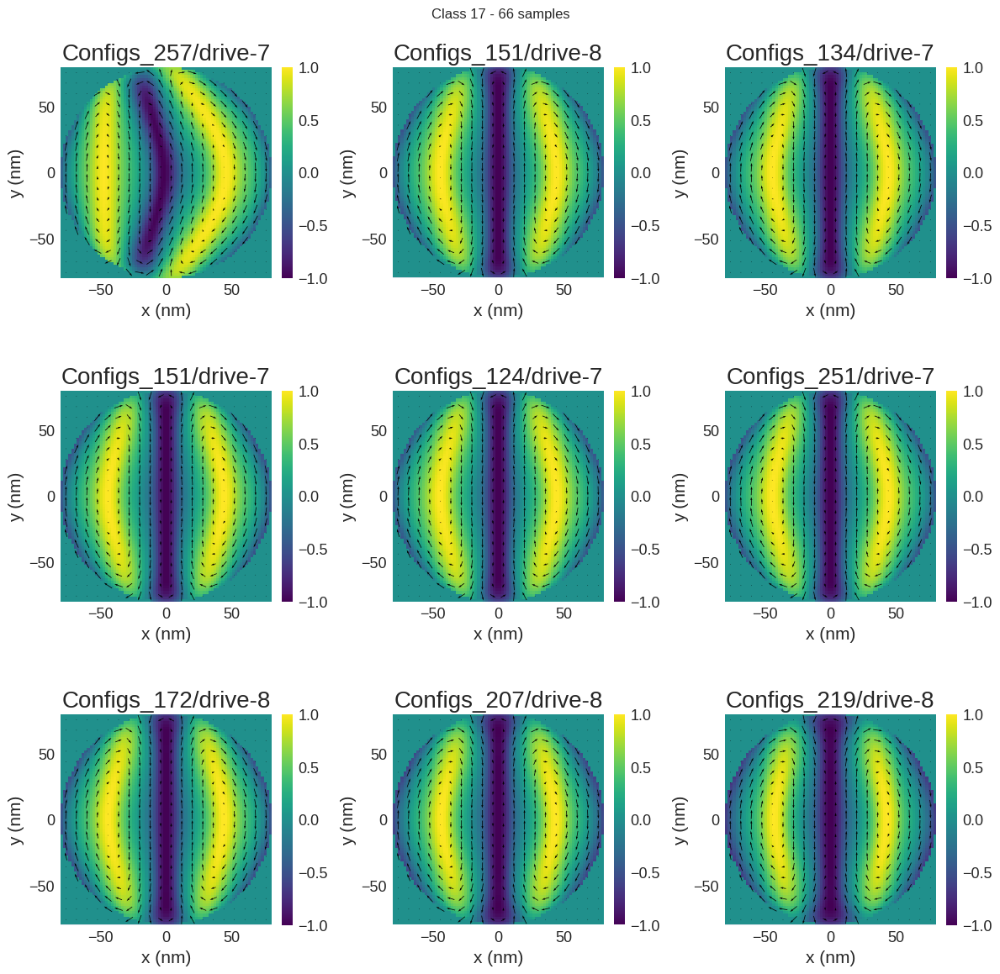

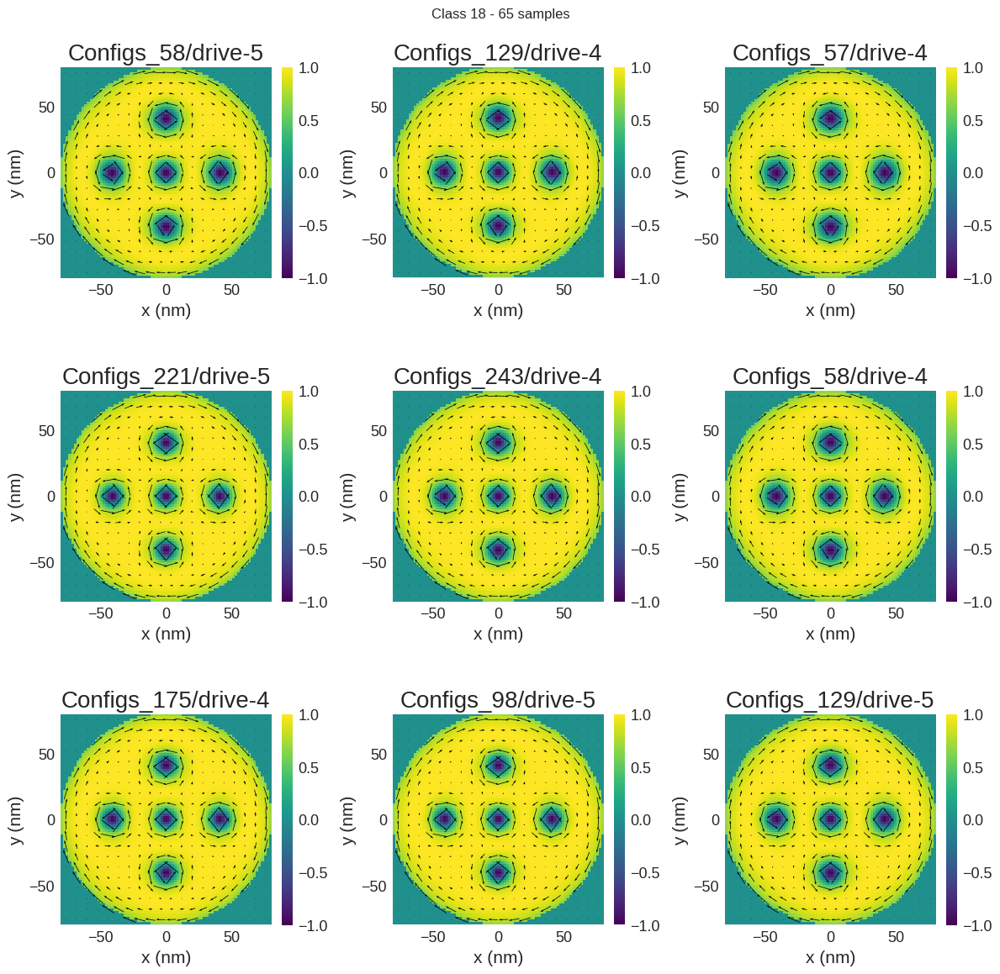

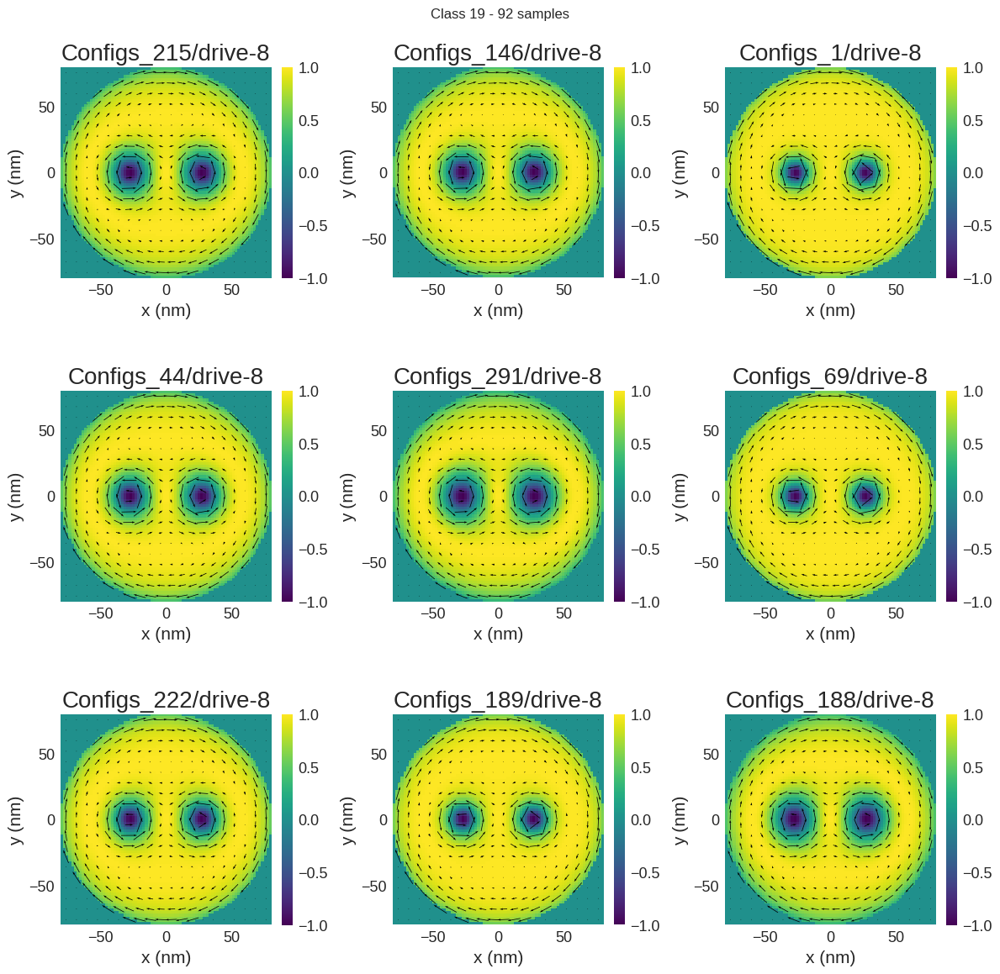

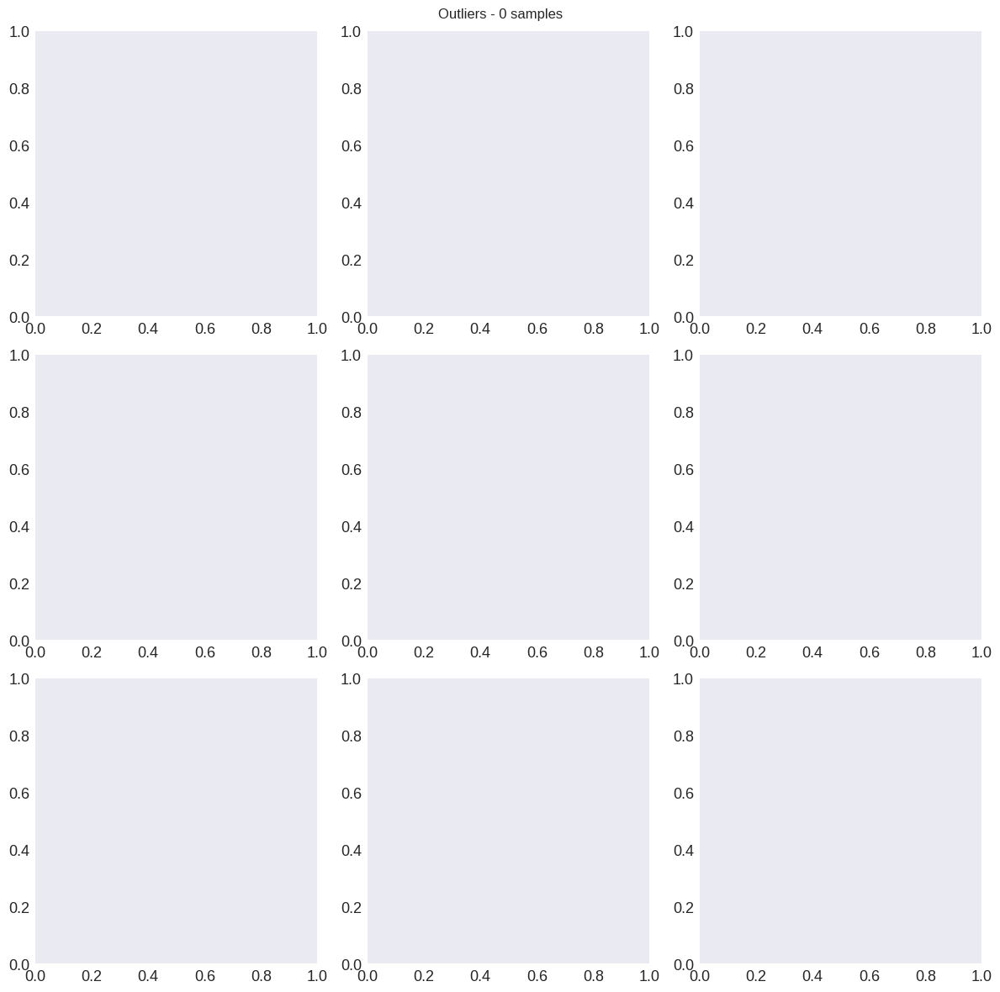

In [8]:
from plotting import plot_all_examples

plot_all_examples(class_dict, parameters_dict)